# Characterization of SLE PRS-associated shifts in myeloid cells

In [1]:
import pandas as pd
import numpy as np
import pp, cna, os, pickle
pp.umapprops['s'] = 0.6
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import scipy.stats as st
import statsmodels.api as sm
fig_dir = '/data/srlab/lrumker/MCSC_Project/cna-prs/figs/'
src_folder = "/data/srlab/lrumker/datasets/onek1k/pheno/"
res_folder = "/data/srlab/lrumker/MCSC_Project/cna-prs/results/"
np.random.seed(0)

In [2]:
# From Okabe & Ito, "colorblind-friendly" palette 
from matplotlib.colors import LinearSegmentedColormap
color_dict = {'orange': '#E69F00', 'skyblue': '#56B4E9', 'green': '#009E73', 
              'yellow': '#F0E442', 'purple': '#CC79A7', 'oceanblue': '#0072B2', 
              'vermillion': '#E63d00'} # O&I use '#D55E00'

In [3]:
# Subscript in text mode not math mode (avoids italics)
params = {'mathtext.default': 'regular' }          
plt.rcParams.update(params)

## Export for gene set enrichment analysis

In [4]:
res = pickle.load(open("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/SLE_Myeloid.p", 'rb'))
res.vargene_cors.to_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/SLE_Myeloid_vargenecors.csv")

## Test PRS association, after conditioning on IFN expression

In [5]:
celltype="Myeloid"
scorename="SLE"
d = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/"+celltype+".h5ad")

# QC individuals 
# Remove individuals without documented clinical information
meta = pd.read_csv(src_folder+"sample_meta.csv", index_col = 0)
meta_clin = meta.drop(columns = meta.columns[pd.isna(meta).sum(axis=0)<400], inplace = False) # 32 clinical variables
rm_ids = meta_clin.index[pd.isna(meta_clin).sum(axis=1)==meta_clin.shape[1]]
meta = meta.drop(index=rm_ids)

# Remove individuals with lupus
SLE_terms = ['SLE', 'lupus']
meta['non_null'] = [True if type(meta.Other_Disease.values[i]) is not float else False \
                             for i in np.arange(meta.shape[0])]
meta['has_SLE'] = np.repeat(False, meta.shape[0])
for SLE_term in SLE_terms:
    meta.loc[meta.non_null, 'has_SLE'] = [True if meta.has_SLE.values[i] or SLE_term in meta.Autoimmune_Disease_Other.values[i] or \
                              SLE_term in meta.Other_Disease.values[i] else False for i in np.where(meta.non_null)[0]]
SLE_ids = np.array(meta.index[meta.has_SLE])
meta = meta.drop(index=SLE_ids)

# Load PRS
PRS = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/"+scorename+"_PRS_noMHC.csv", index_col = 0)
PRS.set_index('IDs', inplace = True, drop = True)
PRS.columns = [scorename]
meta= meta.join(PRS)
d.samplem = d.samplem.join(meta.loc[:,[scorename]]) # Ensures PRS only available for known non-SLE indiv.

# Same k selection procedure as in GeNA
# Select k based on cumulative % variance explained
max_nampc = []
for cum_var_exp in [0.50, 0.80]:
    max_nampc.append(np.min(np.where(np.cumsum(d.uns['NAM_varexp'])>cum_var_exp)[0]))

# Compute mean expr per sample of same IFN genes used for Perez et al
ifn_genes = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/ifna_geneset.csv", index_col = 0).iloc[:,0].values
i_ifn_genes = [i for i in np.arange(d.var.shape[0]) if d.var.index[i] in ifn_genes]
ifn_percell = d.X[:,i_ifn_genes].sum(axis=1)
d.obs['IFN'] = ifn_percell
d.obs_to_sample(['IFN'], aggregate = np.mean)    

np.random.seed(0)
# controlling for IFN mean expr sample as an addition to standard covariates
res = cna.tl.association(d, d.samplem[scorename], batches = d.samplem.batch,  
                     covs = d.samplem[['age', 'sex_M', 'gPC1', 'gPC2', 'gPC3', 
                                        'gPC4', 'gPC5', 'gPC6', 'IFN']], 
                         local_test = False, ks = max_nampc)

pickle.dump(res, open("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/"+\
                      scorename+"_"+celltype+"_cntrl_IFN.p", 'wb'))

/data/srlab/lrumker/MCSC_Project/cna/src/cna/tools/_association.py:61: UserWarning: data supported use of 25 NAM PCs, which is the maximum considered. Consider allowing more PCs by using the "ks" argument.
  warnings.warn(('data supported use of {} NAM PCs, which is the maximum considered. '+\


In [6]:
# Association eliminated
res.p

0.919080919080919

## Association tests for individual PRS SNPs

In [7]:
covs = ['age', 'sex_M', 'gPC1', 'gPC2', 'gPC3', 'gPC4', 'gPC5', 'gPC6']
celltype="Myeloid"
scorename="SLE"
d = cna.read("/data/srlab/lrumker/datasets/onek1k/pheno/"+celltype+".h5ad")

# QC individuals 
# Remove individuals without documented clinical information
meta = pd.read_csv(src_folder+"sample_meta.csv", index_col = 0)
meta_clin = meta.drop(columns = meta.columns[pd.isna(meta).sum(axis=0)<400], inplace = False) # 32 clinical variables
rm_ids = meta_clin.index[pd.isna(meta_clin).sum(axis=1)==meta_clin.shape[1]]
meta = meta.drop(index=rm_ids)

if scorename=="SLE":
    # Remove individuals with lupus
    SLE_terms = ['SLE', 'lupus']
    meta['non_null'] = [True if type(meta.Other_Disease.values[i]) is not float else False \
                                 for i in np.arange(meta.shape[0])]
    meta['has_SLE'] = np.repeat(False, meta.shape[0])
    for SLE_term in SLE_terms:
        meta.loc[meta.non_null, 'has_SLE'] = [True if meta.has_SLE.values[i] or \
                                             SLE_term in meta.Autoimmune_Disease_Other.values[i] or \
                                  SLE_term in meta.Other_Disease.values[i] else False \
                                 for i in np.where(meta.non_null)[0]]
    SLE_ids = np.array(meta.index[meta.has_SLE])
    meta = meta.drop(index=SLE_ids)

# Load PRS
PRS = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/"+scorename+"_PRS_noMHC.csv", index_col = 0)
PRS.set_index('IDs', inplace = True, drop = True)
PRS.columns = [scorename]
meta= meta.join(PRS)
d.samplem = d.samplem.join(meta.loc[:,[scorename]]) # Ensures PRS only available for known non-SLE indiv.

# Same k selection procedure as in GeNA
# Select k based on cumulative % variance explained
max_nampc = []
for cum_var_exp in [0.50, 0.80]:
    max_nampc.append(np.min(np.where(np.cumsum(d.uns['NAM_varexp'])>cum_var_exp)[0]))

# Add PRS snps to data object
G = pd.read_table("/data/srlab/lrumker/MCSC_Project/cna-prs/results/geno/SLE.all_chr.DS.vcf.gz",
                 header = None, index_col = 0)
G_ids = pd.read_table("/data/srlab/lrumker/MCSC_Project/cna-prs/results/geno/sample_list.txt",
                 header = None, index_col = 0).index
G.columns = G_ids
betas = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/sumstats/SLE_refined.txt", index_col=0)
betas.index = [betas.index[i]+" " for i in np.arange(betas.shape[0])]

for sel_snp in betas.index:
    if betas.loc[sel_snp,"effect_weight"]<0: # if is currently encoded as dose of protective allele
        # Store instead dose of risk allele
        G.iloc[np.where(G.index==sel_snp)[0][0],:] = 2-G.iloc[np.where(G.index==sel_snp)[0][0],:].values

        # Update snp label accordingly
        flip_snp = ":".join(np.concatenate([sel_snp.split(":")[:2], [sel_snp.split(":")[3].strip(),sel_snp.split(":")[2]+" "]]))
        index_labels = G.index.values
        index_labels[np.where(G.index==sel_snp)[0][0]] = flip_snp
        G.index = index_labels
d.samplem = d.samplem.join(G.T)

In [8]:
# Confirm no snps in PRS with LD > 0.2
np.sum(G.T.corr()**2>0.2).value_counts() 

1    87
dtype: int64

In [9]:
# Compute mean expr per sample of IFN-alpha response gene set
ifn_genes = pd.read_csv("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/ifna_geneset.csv", 
                        index_col = 0).iloc[:,0].values
i_ifn_genes = [i for i in np.arange(d.var.shape[0]) if d.var.index[i] in ifn_genes]
ifn_percell = d.X[:,i_ifn_genes].sum(axis=1)
d.obs['IFN'] = ifn_percell
d.obs_to_sample(['IFN'], aggregate = np.mean)

In [10]:
# Test association to PRS per SNP (note that we test the SLE risk SNP specifically)
per_snp_ps = []
per_snp_pheno_corr = [] # correlation of snp-associated phenotype to IFN-alpha response expression
for allele in G.index:
    np.random.seed(0)
    snp_res = cna.tl.association(d, d.samplem[allele], batches = d.samplem.batch, 
                             covs = d.samplem[covs], ks = max_nampc, local_test = False)
    per_snp_ps.append(snp_res.p)
    per_snp_pheno_corr.append(np.corrcoef(snp_res.ncorrs, d.obs['IFN'][snp_res.kept])[0,1])
    
per_snp = pd.DataFrame({"allele": G.index, "P": per_snp_ps, "r": per_snp_pheno_corr})
per_snp.set_index("allele", drop = True, inplace = True)
per_snp['effect_weight'] = np.abs(betas.effect_weight.values) # because we flipped previously, order matches

In [11]:
# Apply multiple testing correction
# No variant is individually associated
passed, ps_adj, val1, val2 = sm.stats.multipletests(per_snp.P.values, method="fdr_bh", alpha=0.05)
per_snp['P_adj']= ps_adj
min(per_snp.P_adj.values)

0.5432067932067932

## Plot

In [12]:
gene_dict = {'1:161479745:A:G ': 'FCGR2A;rs1801274',
             '2:163110536:A:G ': 'IFIH1, FAP;rs2111485',
             '15:38764843:C:T ': 'FAM98B;rs11073328',
             '2:191943742:C:T ':  'STAT4;rs11889341',
             '1:173191475:G:T ': 'TNFSF4;rs2205960', 
             '7:128589000:T:C ': 'IRF5;rs2070197',
            }

In [13]:
title_size = 20
subtitle_size = 15
annotation_size = 12

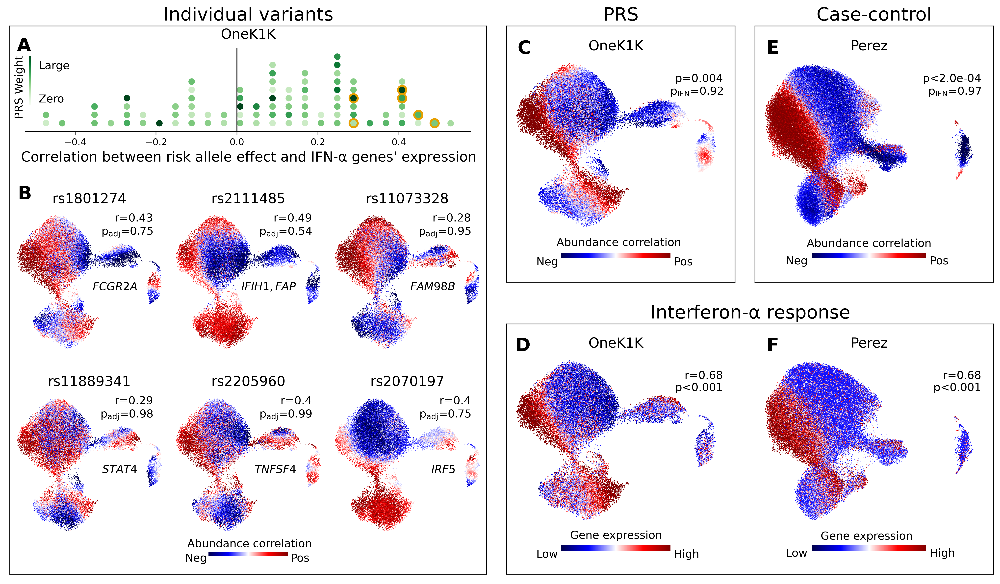

In [14]:
fig = plt.figure(figsize = (15,9), dpi=400, facecolor='white')

gs1 = gridspec.GridSpec(30, 30)
gs1.update(bottom=0.01, left=0.01, top=0.93, right=0.49, wspace=0, hspace=0)
ax_title1 = fig.add_subplot(gs1[:])
ax_title1.axis('off')
ax_title1.set_title('Individual variants', fontsize = title_size)
ax_box1 = fig.add_subplot(gs1[:, :])
ax_box1.set_xticks([])
ax_box1.set_yticks([])
ax_dotplot = fig.add_subplot(gs1[1:6, 1:29])
ax_snp_cbar =  fig.add_subplot(gs1[22:30, 10:20])
axs_snps = [fig.add_subplot(gs1[10:18, 0:10]), fig.add_subplot(gs1[10:18, 10:20]), fig.add_subplot(gs1[10:18, 20:30]),
           fig.add_subplot(gs1[20:28, 0:10]), fig.add_subplot(gs1[20:28, 10:20]), fig.add_subplot(gs1[20:28, 20:30])]
for i in np.arange(len(axs_snps)):
    axs_snps[i].set_xticks([])
    axs_snps[i].set_yticks([])

gs2 = gridspec.GridSpec(43, 23)
gs2.update(left=0.51, right=0.74, bottom = 0.5, top = 0.93, wspace=0, hspace=0)
ax_title2 = fig.add_subplot(gs2[:])
ax_title2.axis('off')
ax_title2.set_title('PRS', fontsize = title_size)
ax_box2 = fig.add_subplot(gs2[:, :])
ax_box2.set_xticks([])
ax_box2.set_yticks([])
ax_prs_cbar = fig.add_subplot(gs2[10:43, :22])
ax_prs = fig.add_subplot(gs2[5:35, :22])

gs3 = gridspec.GridSpec(43, 24)
gs3.update(left=0.76, right=1, bottom = 0.5, top = 0.93, wspace=0, hspace=0)
ax_title3 = fig.add_subplot(gs3[:])
ax_title3.axis('off')
ax_title3.set_title('Case-control', fontsize = title_size)
ax_box3 = fig.add_subplot(gs3[:, :])
ax_box3.set_xticks([])
ax_box3.set_yticks([])
ax_dz_cbar = fig.add_subplot(gs3[10:43, :23])
ax_dz = fig.add_subplot(gs3[5:35, :23])

gs4 = gridspec.GridSpec(3, 3)
gs4.update(left=0.51, right=1, bottom = 0.01, top = 0.43, wspace=0, hspace=0)
ax_title4 = fig.add_subplot(gs4[:])
ax_title4.set_xticks([])
ax_title4.set_yticks([])
ax_title4.set_title(r'Interferon-$\alpha$ response', fontsize = title_size)

gs5 = gridspec.GridSpec(43, 23)
gs5.update(left=0.51, right=0.74, bottom = 0.01, top = 0.43, wspace=0, hspace=0)
ax_ifn_onek1k_cbar = fig.add_subplot(gs5[10:43, :22])
ax_ifn_onek1k = fig.add_subplot(gs5[5:35, :22])

gs6 = gridspec.GridSpec(43, 24)
gs6.update(left=0.76, right=1, bottom = 0.01, top = 0.43, wspace=0, hspace=0)
ax_ifn_perez_cbar = fig.add_subplot(gs6[10:43, :23])
ax_ifn_perez = fig.add_subplot(gs6[5:35, :23])

ax_cbar = fig.add_subplot(gs1[:6, :9])
ax_cbar.axis("off")
ax_cbar.set_in_layout(False)
cbar_plot = ax_cbar.scatter([0,0], [0,0], s = 0.001, 
                            c = per_snp.effect_weight[:2], cmap = "Greens", vmin = 0, vmax = 0.4)
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.45, location='left', ax = ax_cbar, pad = 0)
cbar.set_ticklabels([])
cbar.outline.set_visible(False)
cbar_plot = ax_cbar.scatter([0,0], [0,0],  c = "white", s=0.1, alpha=1)
    
bin_bounds = np.arange(np.min(per_snp.r),np.max(per_snp.r),0.04) #lower bound
for i_bin in np.arange(len(bin_bounds))[1:]:
    in_bin = np.logical_and(per_snp.r>bin_bounds[i_bin-1], per_snp.r<=bin_bounds[i_bin])
    bin_val = np.mean([bin_bounds[i_bin-1], bin_bounds[i_bin]])
    xvals = np.ones(sum(in_bin))*bin_val
    yvals = np.arange(sum(in_bin))+1
    cvals = per_snp.effect_weight[in_bin]
    sel_alleles = per_snp.index[in_bin].tolist()
    highlighted = [sel_alleles[i] in gene_dict.keys() for i in np.arange(len(sel_alleles))]
    if np.sum(highlighted)>0:
        ax_dotplot.scatter(xvals[highlighted], yvals[highlighted], c = color_dict['orange'], 
                           marker = "o", s = 100)
    cbar_plot = ax_dotplot.scatter(xvals, yvals, c = cvals, cmap = "Greens", 
                                    vmin = -0.1, vmax = 0.4)
    
for spine in ['top', 'right', 'left']:
    ax_dotplot.spines[spine].set_visible(False)
ax_dotplot.plot([0,0],[-0,10], c = "black", lw = 1)
ax_dotplot.yaxis.set_visible(False)
ax_dotplot.spines['bottom'].set_position('zero')
ax_dotplot.set_xlabel(r"Correlation between risk allele effect and IFN-$\alpha$ genes' expression",
                     fontsize = subtitle_size)
ax_dotplot.text(-0.55,1.8,'PRS Weight', fontsize=annotation_size, rotation = 90)
ax_dotplot.text(-0.49,3.5,'Zero', fontsize=annotation_size)
ax_dotplot.text(-0.49,7.5,'Large', fontsize=annotation_size)
ax_dotplot.text(-0.02, 0.98, "A", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = ax_dotplot.transAxes, fontweight="bold")
ax_dotplot.set_title("OneK1K", fontsize = subtitle_size)

for i, allele in enumerate(gene_dict.keys()):
    likely_genes = gene_dict[allele].split(";")[0]
    rsID = gene_dict[allele].split(";")[1]
    
    np.random.seed(0)
    snp_res = cna.tl.association(d, d.samplem[allele], batches = d.samplem.batch, 
                             covs = d.samplem[covs], ks = max_nampc, local_test = False)
    pp.scatter_random(d.obsm['X_umap'][snp_res.kept,0], d.obsm['X_umap'][snp_res.kept,1], 
                      c=snp_res.ncorrs, cmap = "seismic", ax = axs_snps[i])
    rval = np.corrcoef(d.obs.IFN.values[snp_res.kept], snp_res.ncorrs)[0,1]
    axs_snps[i].text(0.9, 0.88, "$p_{adj}$="+str(np.around(per_snp.P_adj[allele],2)), ha='right', va='top', 
                     transform=axs_snps[i].transAxes, fontsize=annotation_size)
    axs_snps[i].text(0.9, 0.97, "r="+str(np.around(rval,2)), ha='right', va='top', 
                     transform=axs_snps[i].transAxes, fontsize = annotation_size)
    axs_snps[i].text(0.8, 0.5, "$\it{"+likely_genes+"}$", ha='right', va='top', 
                     transform=axs_snps[i].transAxes, fontsize = annotation_size) 
    axs_snps[i].axis("off")

    axs_snps[i].set_title(rsID, fontsize = subtitle_size, color = "black")
axs_snps[0].text(0.05, 1.1, "B", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = axs_snps[0].transAxes, fontweight="bold") 

UMAP1 = d.obsm['X_umap'][snp_res.kept,0] 
UMAP2 = d.obsm['X_umap'][snp_res.kept,1] 
cbar_plot = ax_snp_cbar.scatter(UMAP1, UMAP2, c = snp_res.ncorrs, s=0.001, cmap="seismic")
cover_plot = ax_snp_cbar.scatter(UMAP1, UMAP2, c = "white", s=1) 
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='bottom', ax = ax_snp_cbar)
cbar.set_ticklabels([])
ax_snp_cbar.text(0.75*np.min(UMAP1),2.2*np.min(UMAP2),'Abundance correlation', fontsize=annotation_size)
ax_snp_cbar.text(0.8*np.min(UMAP1),3*np.min(UMAP2),'Neg', fontsize=annotation_size)
ax_snp_cbar.text(0.7*np.max(UMAP1),3*np.min(UMAP2),'Pos', fontsize=annotation_size)
cbar.outline.set_visible(False)

pp.umapprops['s'] = 0.6
res = pickle.load(open(res_folder+"SLE_casecontrol/Perez_Obs_SLE_Myeloid.p", 'rb'))
res_ifn = pickle.load(open(res_folder+"SLE_casecontrol/Perez_Obs_SLE_Myeloid_cntrl_IFN.p", 'rb'))
cbar_plot = ax_dz_cbar.scatter(res.UMAP1, res.UMAP2, c = res.ncorrs, s=0.001, cmap="seismic")
cover_plot = ax_dz_cbar.scatter(res.UMAP1, res.UMAP2, c = "white", s=1) 
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='bottom', ax = ax_dz_cbar)
cbar.set_ticklabels([])
ax_dz_cbar.text(0.35*np.min(res.UMAP1),2.7*np.min(res.UMAP2),'Abundance correlation', fontsize=annotation_size)
ax_dz_cbar.text(0.68*np.min(res.UMAP1),3.7*np.min(res.UMAP2),'Neg', fontsize=annotation_size)
ax_dz_cbar.text(0.7*np.max(res.UMAP1),3.7*np.min(res.UMAP2),'Pos', fontsize=annotation_size)
cbar.outline.set_visible(False)
pp.scatter_random(res.UMAP1, res.UMAP2, c = res.ncorrs, cmap = "seismic", ax = ax_dz)
ax_dz.text(0.99, 0.9, "p<"+'{:.1e}'.format(res.p),  # minimum p-value attained
                            ha='right', va='top', transform=ax_dz.transAxes, fontsize = annotation_size)
ax_dz.text(.99, 0.83, "p$_{IFN}$="+str(np.around(res_ifn.p,2)), ha='right', va='top', 
        transform=ax_dz.transAxes, fontsize = annotation_size)
ax_dz.set_title("Perez", fontsize = subtitle_size)
ax_dz.text(0.05, 1.04, "E", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = ax_dz.transAxes, fontweight="bold")

cbar_plot = ax_ifn_perez_cbar.scatter(res.UMAP1, res.UMAP2, c = res.ncorrs, s=0.001, cmap="seismic")
cover_plot = ax_ifn_perez_cbar.scatter(res.UMAP1, res.UMAP2, c = "white", s=1) 
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='bottom', ax = ax_ifn_perez_cbar)
cbar.set_ticklabels([])
ax_ifn_perez_cbar.text(0.13*np.min(res.UMAP1),2.7*np.min(res.UMAP2),'Gene expression', fontsize=annotation_size) 
ax_ifn_perez_cbar.text(0.68*np.min(res.UMAP1),3.7*np.min(res.UMAP2),'Low', fontsize=annotation_size)
ax_ifn_perez_cbar.text(0.7*np.max(res.UMAP1),3.7*np.min(res.UMAP2),'High', fontsize=annotation_size)
cbar.outline.set_visible(False)
pp.scatter_random(res.UMAP1, res.UMAP2, c = res.IFN, cmap = "seismic", ax = ax_ifn_perez)
rval = np.corrcoef(res.IFN, res.ncorrs)[0,1]
ax_ifn_perez.text(0.99, 0.9, "r="+str(np.around(rval,2)), ha='right', va='top', 
                  transform=ax_ifn_perez.transAxes, fontsize = annotation_size)
ax_ifn_perez.text(0.99, 0.83, "p<0.001", ha='right', va='top', 
                  transform=ax_ifn_perez.transAxes, fontsize = annotation_size)
ax_ifn_perez.set_title("Perez", fontsize = subtitle_size)
ax_ifn_perez.text(0.05, 1.04, "F", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = ax_ifn_perez.transAxes, fontweight="bold")

pp.umapprops['s'] = 1.4
res = pickle.load(open(res_folder+"PRS/SLE_Myeloid.p", 'rb'))
UMAP1 = d.obsm['X_umap'][res.kept,0] 
UMAP2 = d.obsm['X_umap'][res.kept,1] 
cbar_plot = ax_prs_cbar.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.001, cmap="seismic")
cover_plot = ax_prs_cbar.scatter(UMAP1, UMAP2, c = "white", s=1) 
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='bottom', ax = ax_prs_cbar)
cbar.set_ticklabels([])
ax_prs_cbar.text(0.35*np.min(UMAP1),2.2*np.min(UMAP2),'Abundance correlation', fontsize=annotation_size)
ax_prs_cbar.text(0.68*np.min(UMAP1),3*np.min(UMAP2),'Neg', fontsize=annotation_size)
ax_prs_cbar.text(0.7*np.max(UMAP1),3*np.min(UMAP2),'Pos', fontsize=annotation_size)
cbar.outline.set_visible(False)
pp.scatter_random(UMAP1, UMAP2, c = res.ncorrs, cmap = "seismic", ax = ax_prs)
ax_prs.text(0.99, 0.9, "p="+str(np.around(res.p,3)), ha='right', va='top', transform=ax_prs.transAxes,
            fontsize = annotation_size)
res_ifn = pickle.load(open("/data/srlab/lrumker/MCSC_Project/cna-prs/results/PRS/SLE_Myeloid_cntrl_IFN.p", 'rb'))
ax_prs.text(.99, 0.83, "p$_{IFN}$="+str(np.around(res_ifn.p,2)), ha='right', va='top', 
        transform=ax_prs.transAxes, fontsize = annotation_size)
ax_prs.set_title("OneK1K", fontsize = subtitle_size)
ax_prs.text(0.05, 1.04, "C", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = ax_prs.transAxes, fontweight="bold")    
    

cbar_plot = ax_ifn_onek1k_cbar.scatter(UMAP1, UMAP2, c = res.ncorrs, s=0.001, cmap="seismic")
cover_plot = ax_ifn_onek1k_cbar.scatter(UMAP1, UMAP2, c = "white", s=1) 
cbar = plt.colorbar(cbar_plot, ticks = [], shrink=0.5, location='bottom', ax = ax_ifn_onek1k_cbar)
cbar.set_ticklabels([])
ax_ifn_onek1k_cbar.text(0.13*np.min(UMAP1),2.2*np.min(UMAP2),'Gene expression', fontsize=annotation_size)
ax_ifn_onek1k_cbar.text(0.68*np.min(UMAP1),3*np.min(UMAP2),'Low', fontsize=annotation_size)
ax_ifn_onek1k_cbar.text(0.7*np.max(UMAP1),3*np.min(UMAP2),'High', fontsize=annotation_size)
cbar.outline.set_visible(False)
pp.scatter_random(UMAP1, UMAP2, c = d.obs.IFN[res.kept], cmap = "seismic", ax = ax_ifn_onek1k)
rval = np.corrcoef(d.obs.IFN[res.kept], res.ncorrs)[0,1]
ax_ifn_onek1k.text(0.99, 0.9, "r="+str(np.around(rval,2)), ha='right', va='top', 
        transform=ax_ifn_onek1k.transAxes, fontsize = annotation_size)
ax_ifn_onek1k.text(0.99, 0.83, "p<0.001", ha='right', va='top', 
        transform=ax_ifn_onek1k.transAxes, fontsize = annotation_size)
ax_ifn_onek1k.set_title("OneK1K", fontsize = subtitle_size)
ax_ifn_onek1k.text(0.04, 1.04, "D", fontsize=title_size, horizontalalignment='left',
            verticalalignment='center', transform = ax_ifn_onek1k.transAxes, fontweight="bold")

for ax in [ax_ifn_onek1k, ax_ifn_perez, ax_prs, ax_prs_cbar, ax_dz, 
           ax_dz_cbar, ax_ifn_onek1k_cbar, ax_ifn_perez_cbar, ax_snp_cbar]:
    ax.axis("off")
plt.savefig(fig_dir+"PRS_mainfig.png")
plt.show()